## 1. Setup and Path Configuration

In [1]:
import time
import pandas as pd
import matplotlib.pyplot as plt
from pathlib import Path
import cv2
import numpy as np
from IPython.display import Image, display
from ultralytics import YOLO
import random

# ================= CONFIGURAÇÃO DE CAMINHOS =================
unb_server = True

if unb_server:
    BASE_DIR = Path("/home/antoniovinicius/projects/sandbox_yolo26") 
else:
    BASE_DIR = Path("/home/avmoura_linux/Documents/unb/sandbox_yolo26") 

LOG_DIR = BASE_DIR / "logs/ph2_finetuning"
TEST_IMAGES_DIR = BASE_DIR / "datasets/ph2/test/images"
WEIGHTS_PATH = LOG_DIR / "weights/best.pt"
RESULTS_CSV = LOG_DIR / "results.csv"

## 2. Data Loading

In [2]:
# O YOLO compila todas as métricas de treino e validação num único CSV
if RESULTS_CSV.exists():
    df_results = pd.read_csv(RESULTS_CSV)
    
    # Remove os espaços em branco que o YOLO costuma deixar nos nomes das colunas
    df_results.columns = df_results.columns.str.strip()
    
    print(f"Métricas carregadas com sucesso! Total de épocas: {len(df_results)}")
    display(df_results.head(3))
else:
    print(f"Arquivo não encontrado: {RESULTS_CSV}")

Métricas carregadas com sucesso! Total de épocas: 100


,epoch,time,train/box_loss,train/seg_loss,train/cls_loss,train/dfl_loss,train/sem_loss,metrics/precision(B),metrics/recall(B),metrics/mAP50(B),...,metrics/mAP50(M),metrics/mAP50-95(M),val/box_loss,val/seg_loss,val/cls_loss,val/dfl_loss,val/sem_loss,lr/pg0,lr/pg1,lr/pg2
0,1,5.83420,1.23088,4.81195,5.92650,0.02215,5.66340,0.00296,0.85714,0.00962,...,0.00560,0.00367,0.81257,2.85820,8.92109,0.02060,0,0.000140,0.000140,0.000140
1,2,7.89626,1.06082,3.67724,6.04767,0.01865,3.98234,0.00321,0.92857,0.28264,...,0.29126,0.20178,0.76651,2.07481,8.73401,0.01947,0,0.000297,0.000297,0.000297
2,3,10.23670,0.81256,2.03610,5.24150,0.01341,1.60076,0.00333,0.96429,0.39847,...,0.39847,0.30239,0.69581,2.36508,8.63967,0.01743,0,0.000451,0.000451,0.000451


## 3. Training Loss Analysis

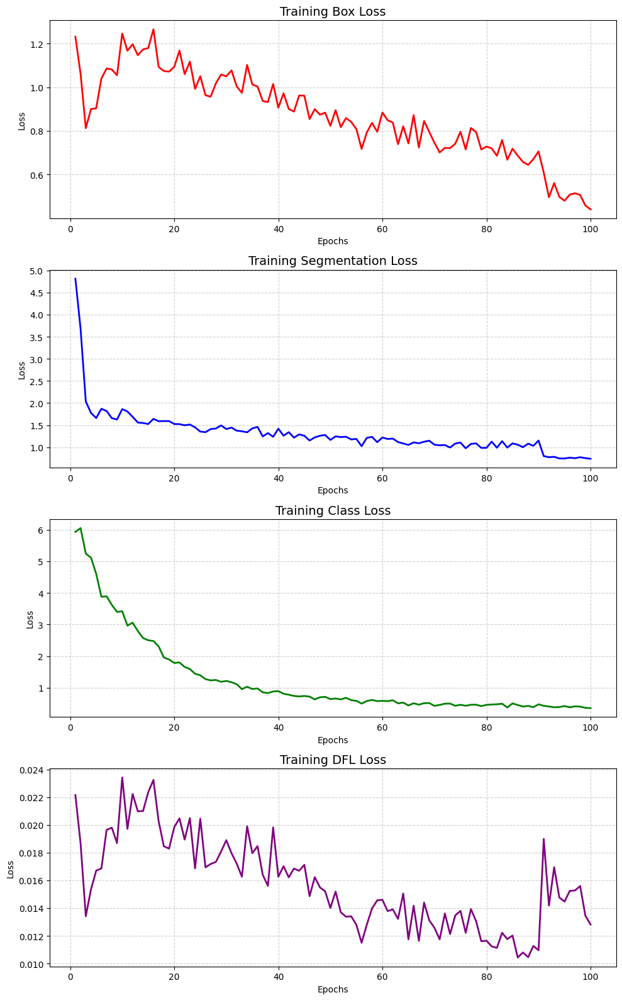

In [3]:
# Definindo as métricas principais de treino que queremos observar
train_losses = {
    "Box Loss": ("train/box_loss", "red"),
    "Segmentation Loss": ("train/seg_loss", "blue"),
    "Class Loss": ("train/cls_loss", "green"),
    "DFL Loss": ("train/dfl_loss", "purple")
}

fig, axes = plt.subplots(len(train_losses), 1, figsize=(10, 4 * len(train_losses)))

for i, (title, (col_name, color)) in enumerate(train_losses.items()):
    if col_name in df_results.columns:
        axes[i].plot(df_results['epoch'], df_results[col_name], color=color, linewidth=2)
        axes[i].set_title(f"Training {title}", fontsize=14)
        axes[i].set_xlabel("Epochs")
        axes[i].set_ylabel("Loss")
        axes[i].grid(True, linestyle="--", alpha=0.6)

plt.tight_layout()
plt.show()

## 4. Validation Metrics (mAP)

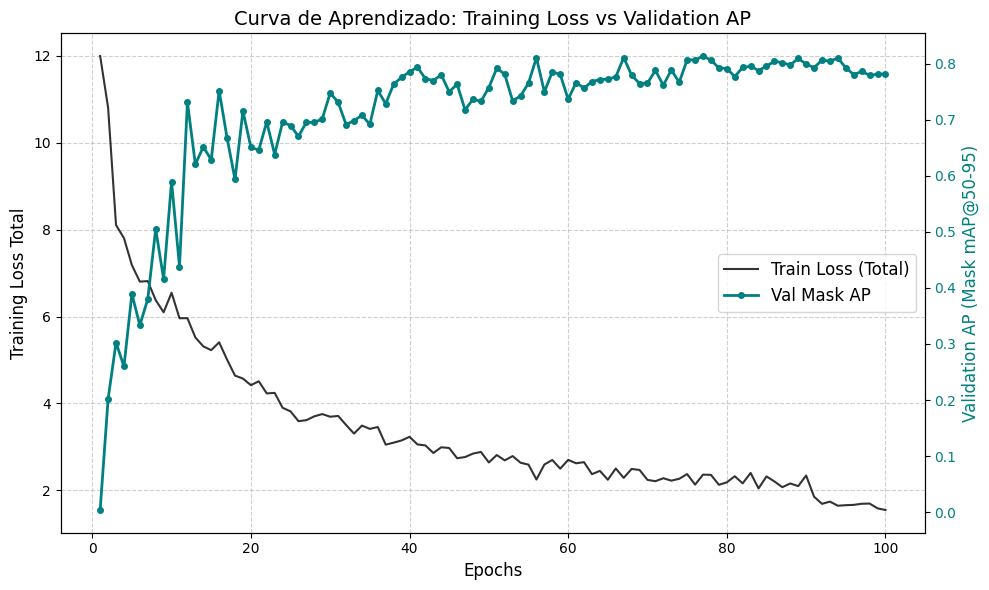

In [ ]:
fig, ax1 = plt.subplots(figsize=(10, 6))

epochs = df_results['epoch']

color1 = 'black'
ax1.set_xlabel('Epochs', fontsize=12)
ax1.set_ylabel('Training Loss Total', color=color1, fontsize=12)

# O YOLO separa as losses. Vamos somá-las para criar a "Loss Total" igual ao SAM3
loss_cols = ['train/box_loss', 'train/seg_loss', 'train/cls_loss', 'train/dfl_loss']
if all(col in df_results.columns for col in loss_cols):
    total_train_loss = df_results[loss_cols].sum(axis=1)
    ax1.plot(epochs, total_train_loss, color=color1, label="Train Loss (Total)", alpha=0.8)
else:
    # Fallback caso alguma coluna falte
    ax1.plot(epochs, df_results['train/seg_loss'], color=color1, label="Train Seg Loss", alpha=0.8)

ax1.tick_params(axis='y', labelcolor=color1)
ax1.grid(True, linestyle="--", alpha=0.6)

ax2 = ax1.twinx()  # Instancia um segundo eixo Y que compartilha o mesmo eixo X
color2 = 'teal'
ax2.set_ylabel('Validation AP (Mask mAP@50-95)', color=color2, fontsize=12)

# Usamos a métrica mAP50-95 das máscaras como indicador principal de sucesso
val_metric = 'metrics/mAP50-95(M)'
if val_metric in df_results.columns:
    # markersize=4 deixa os pontinhos um pouco menores e mais elegantes nas 100 épocas
    ax2.plot(epochs, df_results[val_metric], color=color2, marker='o', label="Val Mask AP", linewidth=2, markersize=4)

ax2.tick_params(axis='y', labelcolor=color2)

lines_1, labels_1 = ax1.get_legend_handles_labels()
lines_2, labels_2 = ax2.get_legend_handles_labels()
ax1.legend(lines_1 + lines_2, labels_1 + labels_2, loc='center right', fontsize=12)

plt.title("Learning Curve: Training Loss vs Validation AP", fontsize=14)
plt.tight_layout()
plt.show()

In [ ]:
# Gráfico das métricas AP (Average Precision) na validação
fig, ax1 = plt.subplots(figsize=(12, 6))

ax1.set_xlabel('Epochs', fontsize=12)
ax1.set_ylabel('mAP Score', fontsize=12)

# Máscaras (Segmentation)
if 'metrics/mAP50(M)' in df_results.columns:
    ax1.plot(df_results['epoch'], df_results['metrics/mAP50(M)'], color='teal', label='Mask mAP@50', linewidth=2)
    ax1.plot(df_results['epoch'], df_results['metrics/mAP50-95(M)'], color='darkcyan', linestyle='--', label='Mask mAP@50-95', linewidth=2)

# Bounding Boxes
if 'metrics/mAP50(B)' in df_results.columns:
    ax1.plot(df_results['epoch'], df_results['metrics/mAP50(B)'], color='orange', label='Box mAP@50', linewidth=2)
    ax1.plot(df_results['epoch'], df_results['metrics/mAP50-95(B)'], color='darkorange', linestyle='--', label='Box mAP@50-95', linewidth=2)

ax1.set_title("Validation Metrics: Mask and Box mAP vs Epochs", fontsize=14)
ax1.legend(loc='lower right', fontsize=12)
ax1.grid(True, linestyle="--", alpha=0.6)
plt.tight_layout()
plt.show()

## 5. Qualitative Results (Inference on Test Set)

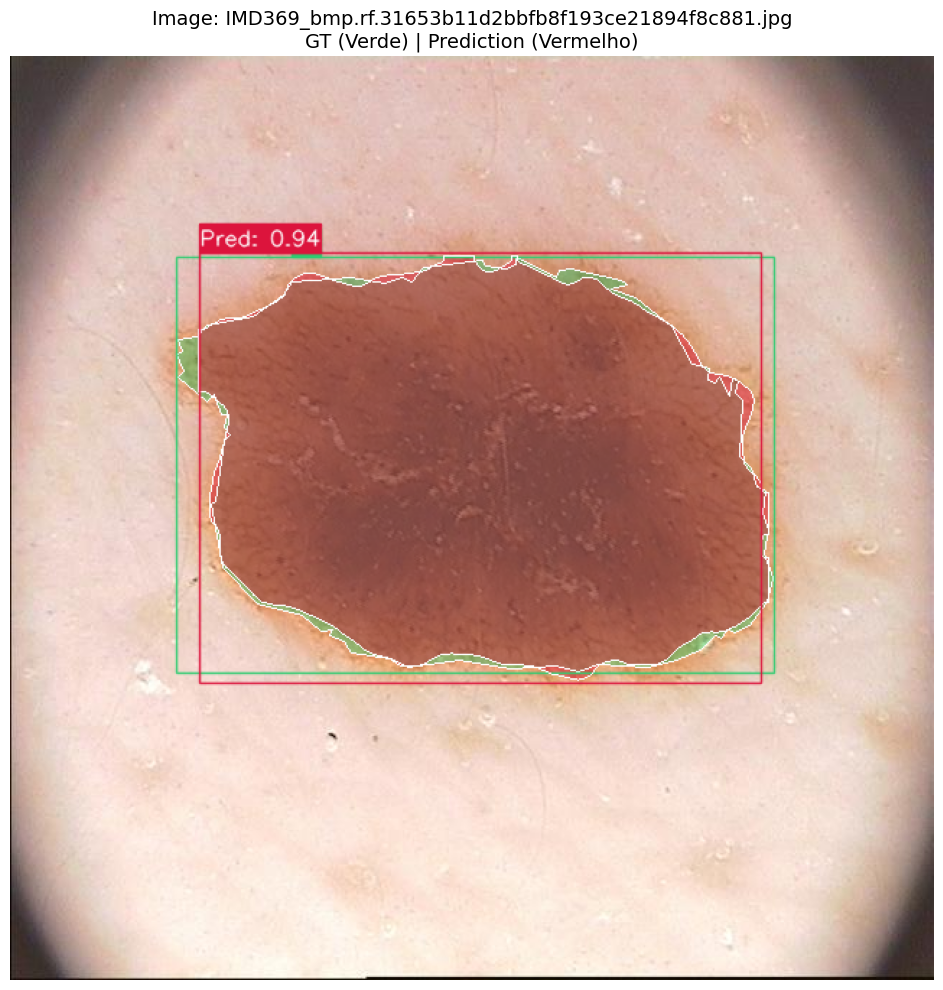

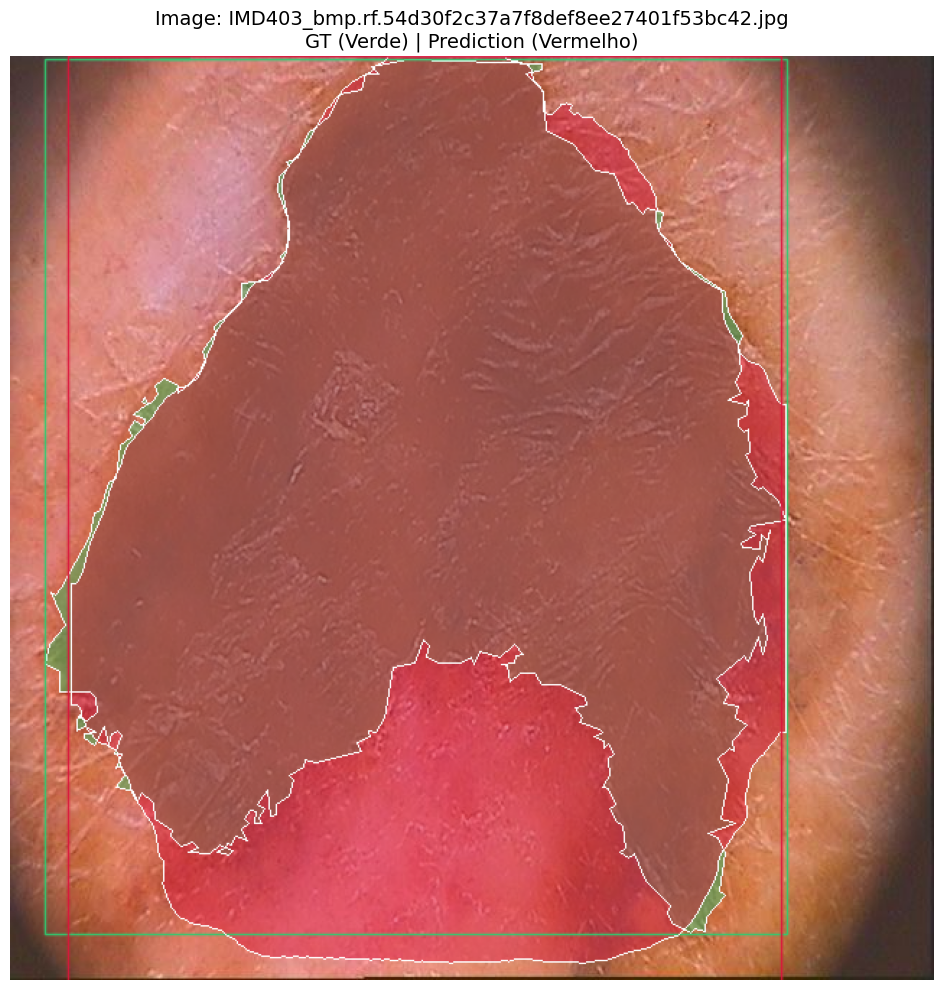

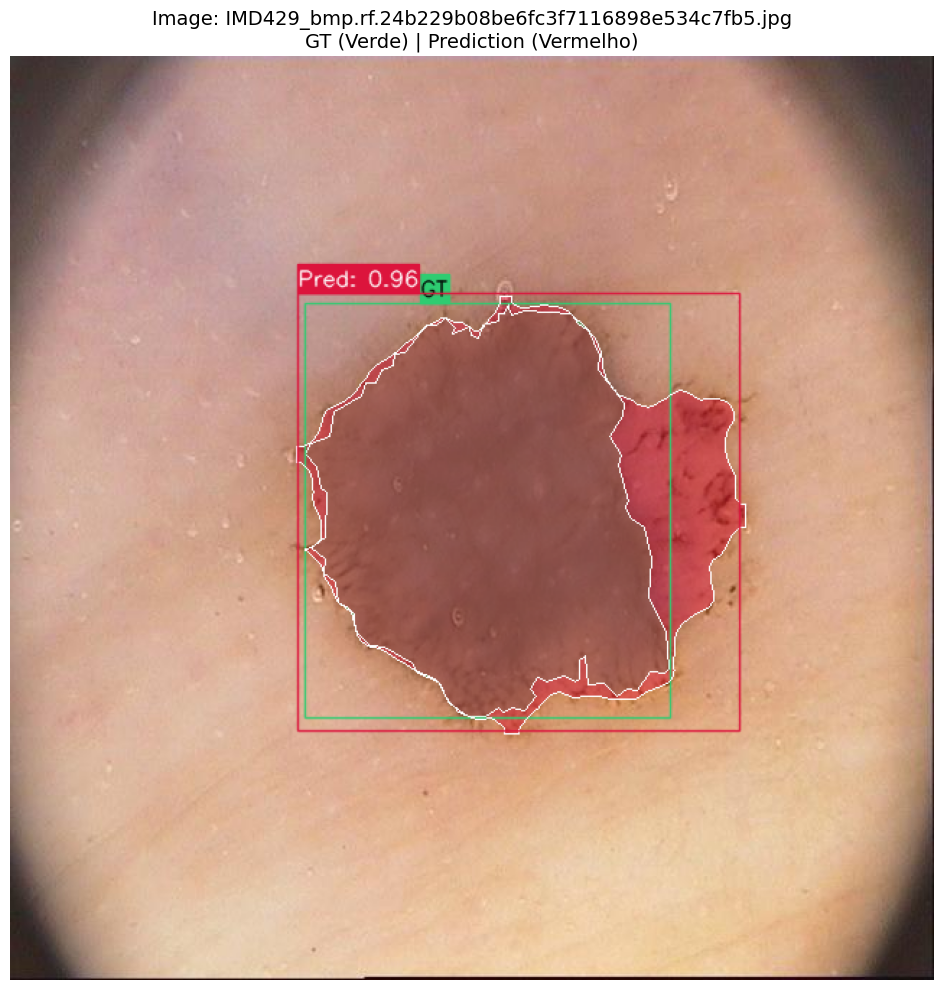

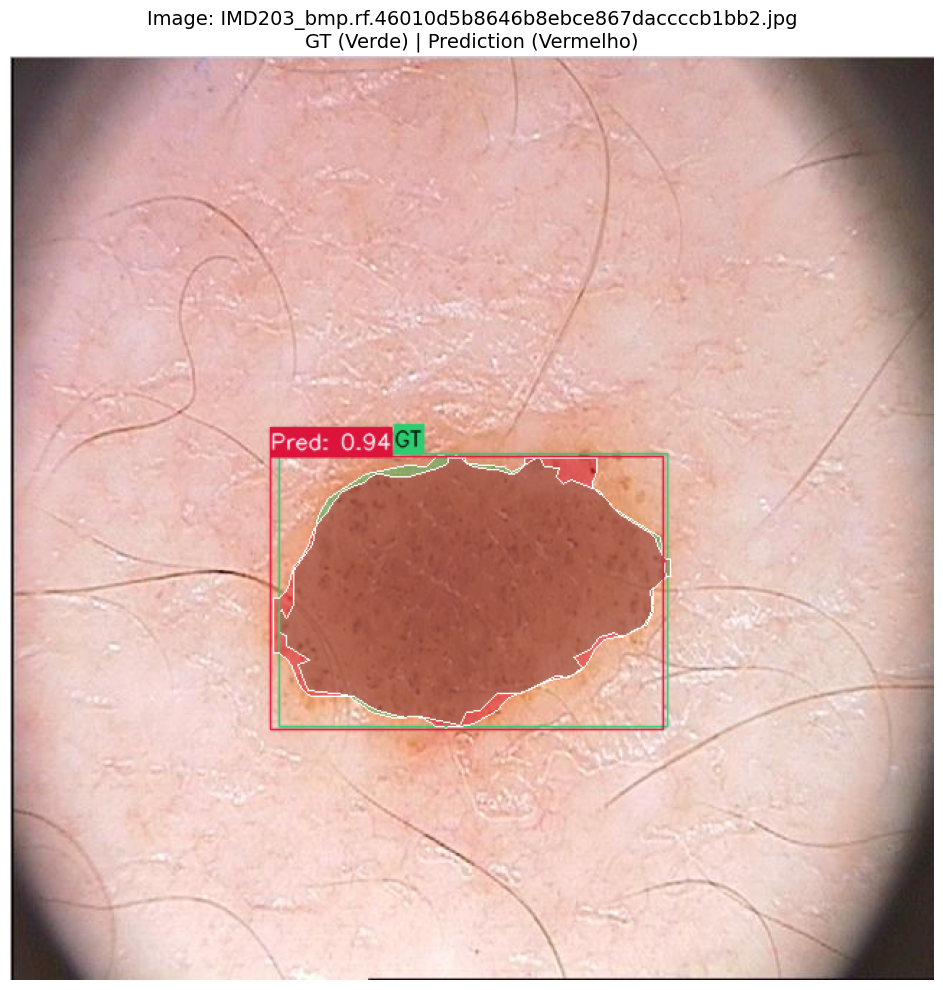

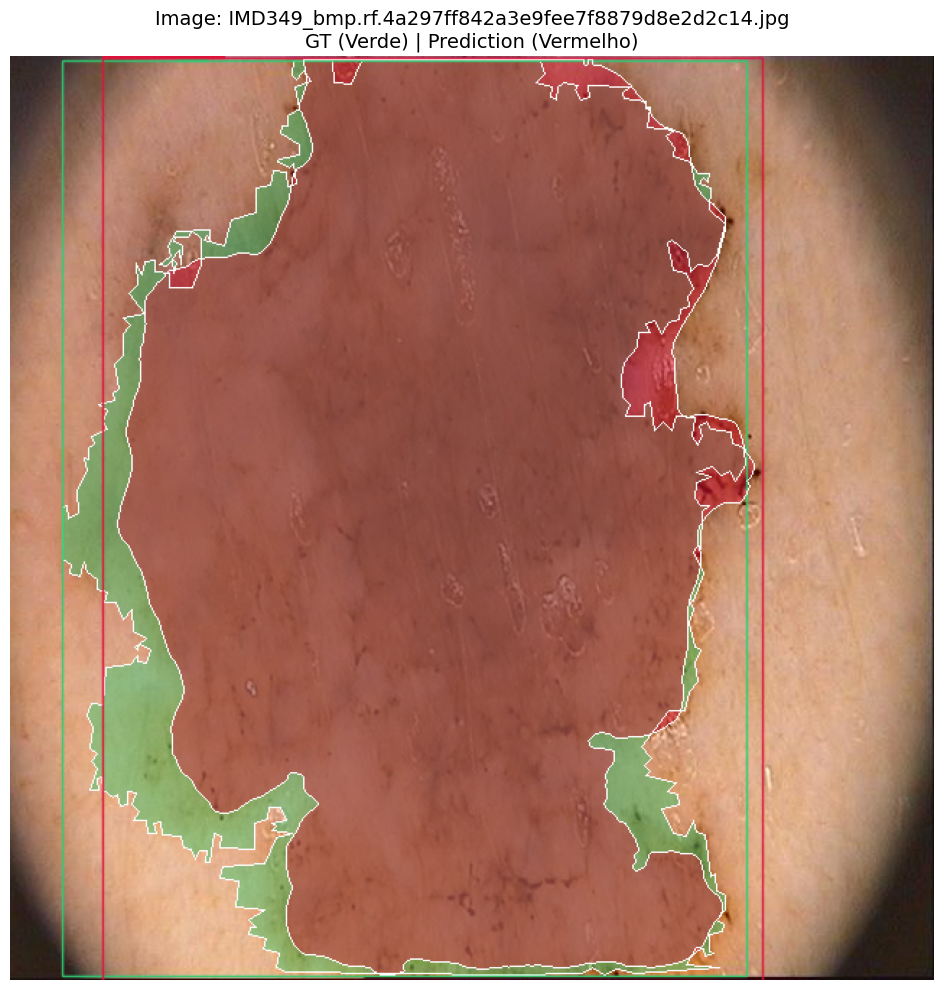

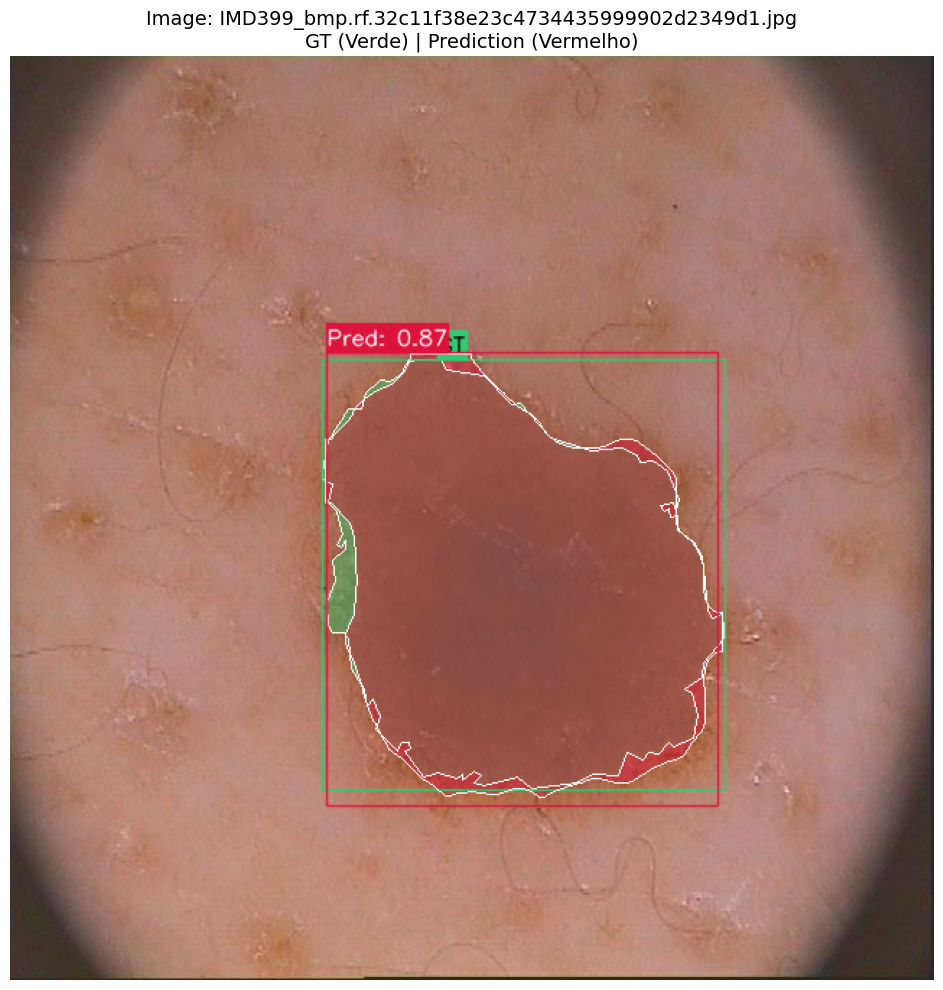

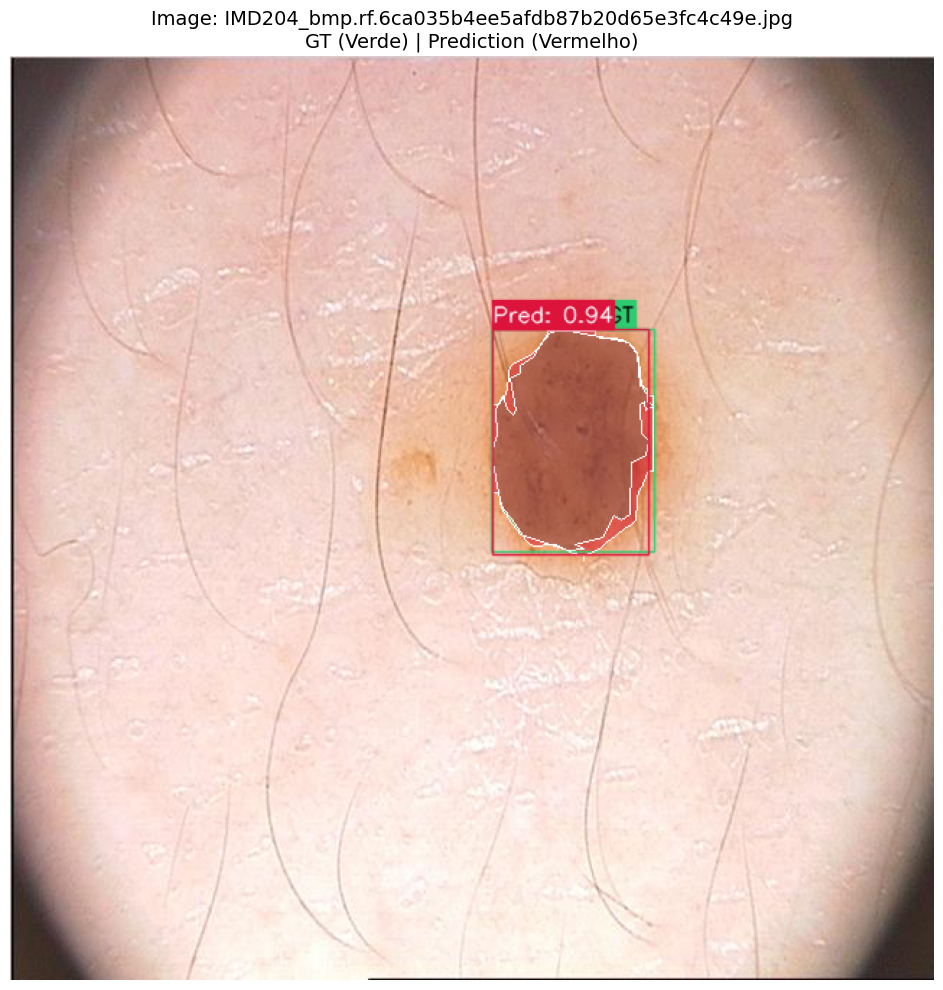

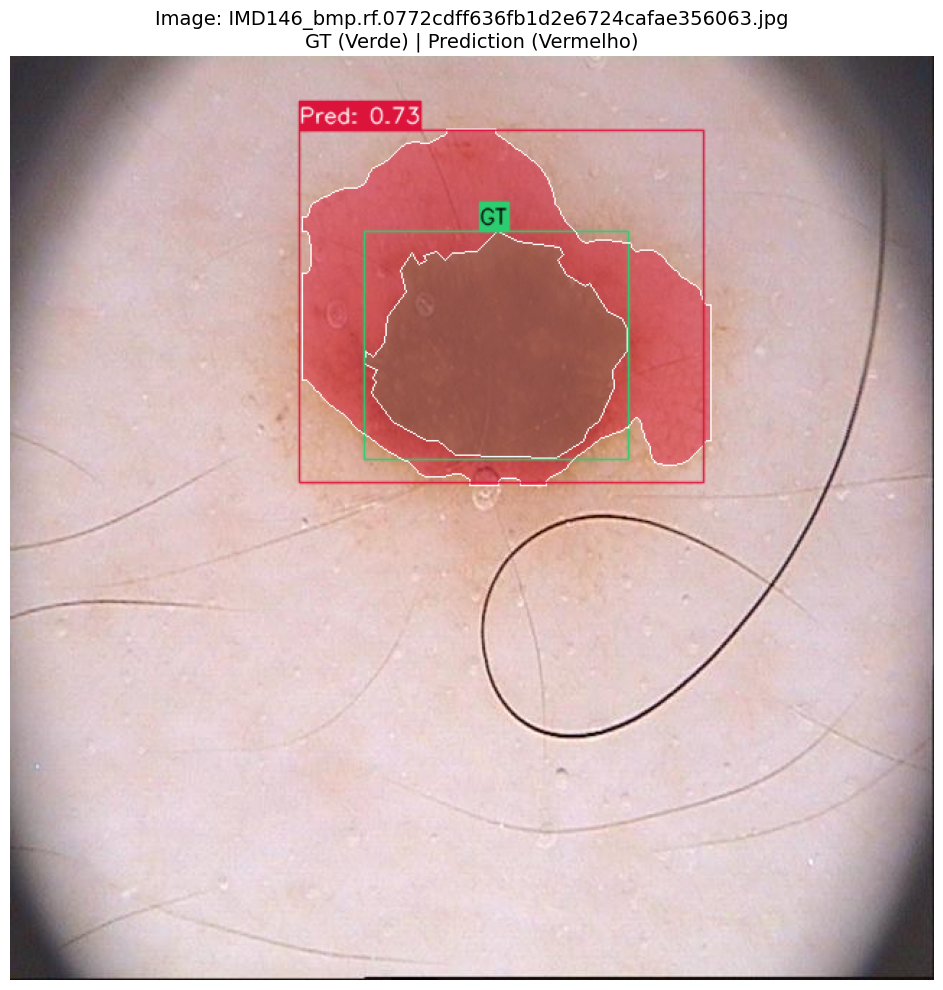

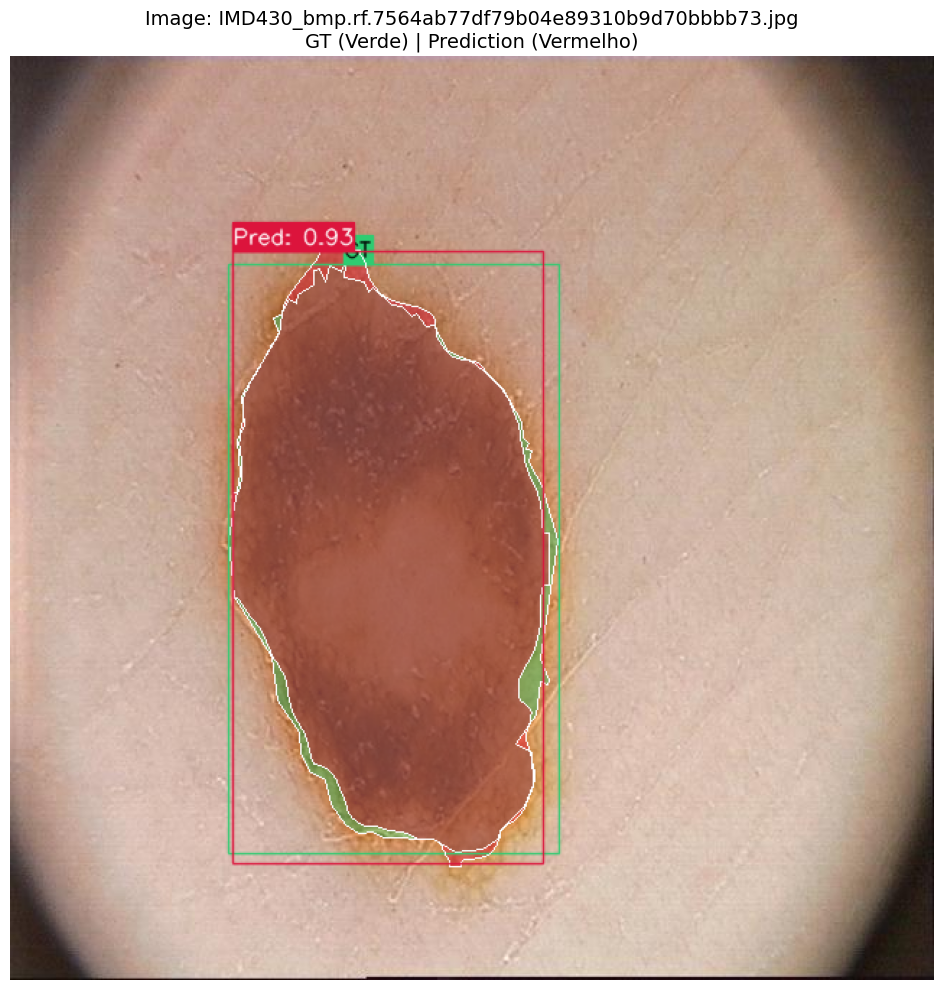

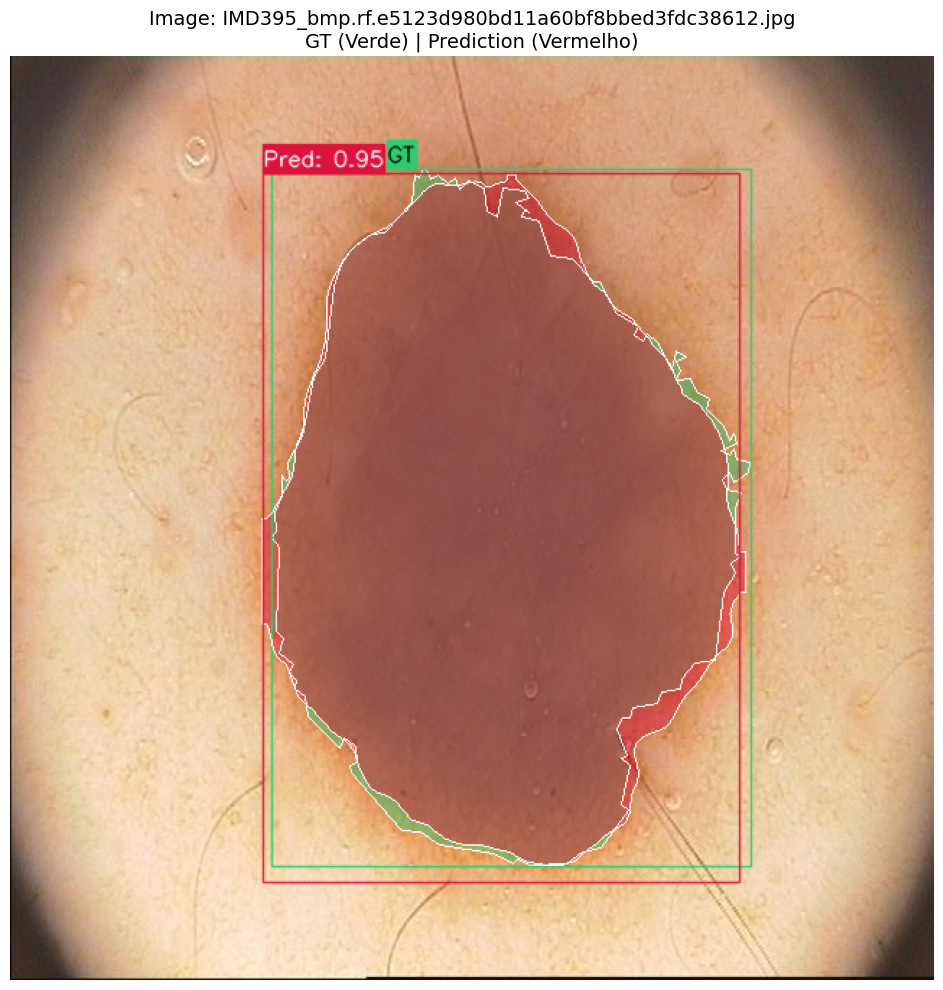


--- RESUMO DE DESEMPENHO (YOLO) ---
Total de imagens processadas: 10
Tempo médio de inferência por imagem: 0.1409 segundos


In [5]:
OVERLAY_MASKS = True  # Mude para False para ver as imagens lado a lado
NUM_IMAGES_TO_SHOW = 10
ALPHA = 0.45          # Nível de transparência das máscaras

# Cores Exatas usadas no script original do SAM3 (Formato BGR do OpenCV)
COLOR_GT = (113, 204, 46)   # Verde Limão suave
COLOR_PRED = (60, 20, 220)  # Vermelho/Carmesim

# A pasta de labels geralmente fica paralela à de images no formato YOLO
TEST_LABELS_DIR = TEST_IMAGES_DIR.parent / "labels"

# Carrega o modelo treinado
model = YOLO(WEIGHTS_PATH)
test_images = list(TEST_IMAGES_DIR.glob("*.jpg")) # Ajuste a extensão se necessário

inference_times = []

if len(test_images) > 0:
    samples = random.sample(test_images, min(NUM_IMAGES_TO_SHOW, len(test_images)))
    
    for img_path in samples:
        label_path = TEST_LABELS_DIR / f"{img_path.stem}.txt"
        
        img_bgr = cv2.imread(str(img_path))
        if img_bgr is None:
            continue
            
        img_h, img_w = img_bgr.shape[:2]
        
        # --- 1. LER GROUND TRUTH (Anotação do Dermatologista em .txt) ---
        gt_polys = []
        if label_path.exists():
            with open(label_path, 'r') as f:
                for line in f:
                    parts = list(map(float, line.strip().split()))
                    if len(parts) > 1:
                        coords = np.array(parts[1:]).reshape(-1, 2)
                        coords[:, 0] *= img_w 
                        coords[:, 1] *= img_h 
                        gt_polys.append(coords.astype(np.int32))
                        
        # --- 2. LER PREDIÇÕES DO MODELO ---
        start_time = time.perf_counter()
        
        results = model.predict(source=img_bgr, conf=0.5, imgsz=640, verbose=False)
        
        inference_times.append(time.perf_counter() - start_time)
        
        pred_polys, pred_boxes, pred_confs = [], [], []
        if results[0].masks is not None and results[0].boxes is not None:
            for mask_xy, box, conf in zip(results[0].masks.xy, results[0].boxes.xyxy, results[0].boxes.conf):
                pred_polys.append(mask_xy.astype(np.int32))
                pred_boxes.append(box.cpu().numpy().astype(np.int32))
                pred_confs.append(float(conf.cpu().numpy()))
        
        # --- 3. DESENHAR ---
        if OVERLAY_MASKS:
            combined_img = img_bgr.copy()
            
            # 3.1 Aplica o GT (Verde) e já mescla
            for poly in gt_polys:
                overlay = combined_img.copy()
                cv2.fillPoly(overlay, [poly], COLOR_GT)
                cv2.addWeighted(overlay, ALPHA, combined_img, 1 - ALPHA, 0, combined_img)
                
            # 3.2 Aplica a Predição (Vermelho) e já mescla
            for poly in pred_polys:
                overlay = combined_img.copy()
                cv2.fillPoly(overlay, [poly], COLOR_PRED)
                cv2.addWeighted(overlay, ALPHA, combined_img, 1 - ALPHA, 0, combined_img)
                
            # 3.3 Contornos, Caixas e Textos
            for poly in gt_polys:
                # Linha branca e EXATAMENTE fina (1 pixel puro, como no SAM3, sem LINE_AA)
                cv2.polylines(combined_img, [poly], isClosed=True, color=(255, 255, 255), thickness=1, lineType=cv2.LINE_8)
                
                # Bounding Box do GT (mantemos LINE_AA aqui para não serrilhar o retângulo)
                x, y, w, h = cv2.boundingRect(poly)
                cv2.rectangle(combined_img, (x, y), (x + w, y + h), COLOR_GT, 1, lineType=cv2.LINE_AA)
                
                # Label GT
                label = "GT"
                (tw, th), _ = cv2.getTextSize(label, cv2.FONT_HERSHEY_SIMPLEX, 0.5, 1)
                offset_x = x + 80 
                cv2.rectangle(combined_img, (offset_x, y - 20), (offset_x + tw, y), COLOR_GT, -1, lineType=cv2.LINE_AA)
                cv2.putText(combined_img, label, (offset_x, y - 5), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0, 0, 0), 1, lineType=cv2.LINE_AA)
                
            for poly, box, conf in zip(pred_polys, pred_boxes, pred_confs):
                # Linha branca e EXATAMENTE fina (1 pixel puro)
                cv2.polylines(combined_img, [poly], isClosed=True, color=(255, 255, 255), thickness=1, lineType=cv2.LINE_8)
                
                # Bounding Box da Predição
                x1, y1, x2, y2 = box
                cv2.rectangle(combined_img, (x1, y1), (x2, y2), COLOR_PRED, 1, lineType=cv2.LINE_AA)
                
                # Label Predição
                label = f"Pred: {conf:.2f}"
                (tw, th), _ = cv2.getTextSize(label, cv2.FONT_HERSHEY_SIMPLEX, 0.5, 1)
                cv2.rectangle(combined_img, (x1, y1 - 20), (x1 + tw, y1), COLOR_PRED, -1, lineType=cv2.LINE_AA)
                cv2.putText(combined_img, label, (x1, y1 - 5), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (255, 255, 255), 1, lineType=cv2.LINE_AA)
            
            # Plot da imagem final Híbrida
            combined_img_rgb = cv2.cvtColor(combined_img, cv2.COLOR_BGR2RGB)
            plt.figure(figsize=(10, 10))
            plt.imshow(combined_img_rgb)
            plt.title(f"Image: {img_path.name}\nGT (Verde) | Prediction (Vermelho)", fontsize=14)
            plt.axis('off')
            plt.tight_layout()
            plt.show()
            
        else:
            # Modo Lado a Lado
            img_gt = img_bgr.copy()
            img_pred = img_bgr.copy()
            
            for poly in gt_polys:
                overlay_gt = img_gt.copy()
                cv2.fillPoly(overlay_gt, [poly], COLOR_GT)
                cv2.addWeighted(overlay_gt, ALPHA, img_gt, 1 - ALPHA, 0, img_gt)
                
                # Linha fina pura
                cv2.polylines(img_gt, [poly], isClosed=True, color=(255, 255, 255), thickness=1, lineType=cv2.LINE_8)
                
                x, y, w, h = cv2.boundingRect(poly)
                cv2.rectangle(img_gt, (x, y), (x + w, y + h), COLOR_GT, 1, lineType=cv2.LINE_AA)
                label = "GT"
                (tw, th), _ = cv2.getTextSize(label, cv2.FONT_HERSHEY_SIMPLEX, 0.5, 1)
                cv2.rectangle(img_gt, (x, y - 20), (x + tw, y), COLOR_GT, -1, lineType=cv2.LINE_AA)
                cv2.putText(img_gt, label, (x, y - 5), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0, 0, 0), 1, lineType=cv2.LINE_AA)
            
            for poly, box, conf in zip(pred_polys, pred_boxes, pred_confs):
                overlay_pred = img_pred.copy()
                cv2.fillPoly(overlay_pred, [poly], COLOR_PRED)
                cv2.addWeighted(overlay_pred, ALPHA, img_pred, 1 - ALPHA, 0, img_pred)
                
                # Linha fina pura
                cv2.polylines(img_pred, [poly], isClosed=True, color=(255, 255, 255), thickness=1, lineType=cv2.LINE_8)
                
                x1, y1, x2, y2 = box
                cv2.rectangle(img_pred, (x1, y1), (x2, y2), COLOR_PRED, 1, lineType=cv2.LINE_AA)
                label = f"Pred: {conf:.2f}"
                (tw, th), _ = cv2.getTextSize(label, cv2.FONT_HERSHEY_SIMPLEX, 0.5, 1)
                cv2.rectangle(img_pred, (x1, y1 - 20), (x1 + tw, y1), COLOR_PRED, -1, lineType=cv2.LINE_AA)
                cv2.putText(img_pred, label, (x1, y1 - 5), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (255, 255, 255), 1, lineType=cv2.LINE_AA)

            fig, axes = plt.subplots(1, 2, figsize=(16, 8))
            axes[0].imshow(cv2.cvtColor(img_pred, cv2.COLOR_BGR2RGB))
            axes[0].set_title("Model Prediction (Vermelho)", fontsize=14)
            axes[0].axis('off')
            
            axes[1].imshow(cv2.cvtColor(img_gt, cv2.COLOR_BGR2RGB))
            axes[1].set_title("Ground Truth (Verde)", fontsize=14)
            axes[1].axis('off')
            
            fig.suptitle(f"Image: {img_path.name}", fontsize=16)
            plt.tight_layout()
            plt.show()
            
    if len(inference_times) > 0:
        avg_time = np.mean(inference_times)
        print(f"\n--- RESUMO DE DESEMPENHO (YOLO) ---")
        print(f"Total de imagens processadas: {len(inference_times)}")
        print(f"Tempo médio de inferência por imagem: {avg_time:.4f} segundos")
else:
    print("Nenhuma imagem encontrada na pasta de testes.")

## 6. Apresentação das Métricas Obtidas

In [6]:
print("="*50)
print("🎯 RESULTADOS DE VALIDAÇÃO (MELHOR ÉPOCA) 🎯")
print("="*50)

if not df_results.empty:
    # Identifica a linha onde a métrica principal (Mask mAP50-95) atingiu o maior valor
    best_epoch_idx = df_results['metrics/mAP50-95(M)'].idxmax()
    best_epoch_data = df_results.iloc[best_epoch_idx]
    
    print(f"Melhor Época: {int(best_epoch_data['epoch'])}\n")
    print(f"  🟦 Mask mAP@50:    \t{best_epoch_data['metrics/mAP50(M)']:.4f}")
    print(f"  🟦 Mask mAP@50-95: \t{best_epoch_data['metrics/mAP50-95(M)']:.4f}")
    print(f"  🟩 BBox mAP@50:    \t{best_epoch_data['metrics/mAP50(B)']:.4f}")
    print(f"  🟩 BBox mAP@50-95: \t{best_epoch_data['metrics/mAP50-95(B)']:.4f}")
else:
    print("Nenhuma métrica de validação encontrada.")
print("="*50)

🎯 RESULTADOS DE VALIDAÇÃO (MELHOR ÉPOCA) 🎯
Melhor Época: 77

  🟦 Mask mAP@50:    	0.9634
  🟦 Mask mAP@50-95: 	0.8140
  🟩 BBox mAP@50:    	0.9634
  🟩 BBox mAP@50-95: 	0.8087
